In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print("CUDA Available:", torch.cuda.is_available())
print("CUDA Version:", torch.version.cuda)
print("cuDNN Version:", torch.backends.cudnn.version())
print("Device Count:", torch.cuda.device_count())
print("Current Device:", torch.cuda.current_device())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")

Using device: cuda
CUDA Available: True
CUDA Version: 12.1
cuDNN Version: 90100
Device Count: 1
Current Device: 0
Device Name: Tesla P100-PCIE-16GB


In [ ]:
!nvidia-smi

Sat Mar 29 10:06:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P0             28W /  250W |       3MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import WeightedRandomSampler
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, recall_score,
                             f1_score, roc_auc_score, roc_curve, confusion_matrix,
                             classification_report, auc)
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import albumentations as A
from albumentations.pytorch import ToTensorV2
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
# Dataset Class
class SkinLesionDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        if isinstance(csv_file, pd.DataFrame):
            self.data = csv_file
        else:
            self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.domain_map = {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.diagnosis_to_target = {
            'NV': 5, 'MEL': 4, 'BKL': 2, 'DF': 3, 'SCC': 6, 'BCC': 1, 'VASC': 8, 'AK': 0, 'UNK': 7
        }

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx]['path']
        if not os.path.exists(img_path):
            raise ValueError(f"Error: Image at {img_path} not found.")
        image = cv2.imread(img_path)
        if image is None:
            raise ValueError(f"Error: Unable to read image at {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = int(self.data.iloc[idx]['target'])
        anatom_site = str(self.data.iloc[idx]['anatom_site_general']).lower()
        domain = self.domain_map.get(anatom_site, 9)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented["image"]
        return image, label, domain

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Mean & std for normalization (ImageNet values)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Improved training augmentations
train_transforms = A.Compose([
    A.LongestMaxSize(1024, p=1),
    A.PadIfNeeded(min_height=1024, min_width=1024, p=1, border_mode=cv2.BORDER_REFLECT_101, value=0),
    A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), ratio=(0.9, 1.1), interpolation=cv2.INTER_CUBIC, p=1),
    A.Rotate(limit=5, p=0.5),  # Reduced rotation
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Affine(scale=(0.98, 1.02), rotate=(-5, 5), shear=(-2, 2), p=0.5),  # Less distortion
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.05, p=0.5),  # Reduced color augmentation
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
    A.HueSaturationValue(hue_shift_limit=1, sat_shift_limit=10, val_shift_limit=15, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.005, scale_limit=0.005, rotate_limit=10, border_mode=cv2.BORDER_REFLECT, p=0.5),  # Prevent extreme shifts
    A.OneOf([
        A.Blur(blur_limit=3, p=0.3),  # Keep mild blur only
        A.GaussNoise(var_limit=(5.0, 10.0), p=0.3),
    ], p=0.5),
    A.Normalize(mean=mean, std=std),
    ToTensorV2(),
])

# Validation (No heavy augmentation)
val_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

# Test set transformations (same as validation)
test_transforms = val_transforms


In [ ]:
# Create dataset
dataset = SkinLesionDataset(csv_file="/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv",transform=train_transforms)

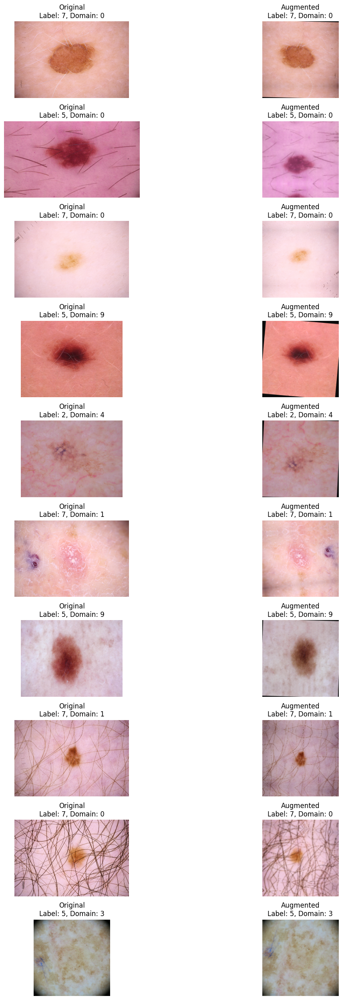

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2

def denormalize(image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Converts a normalized image back to the [0, 1] range.
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  # Convert (C, H, W) to (H, W, C)

    # Denormalize
    image = image * std + mean
    image = np.clip(image, 0, 1)  # Ensure values are in valid range

    return image

def visualize_augmentations(dataset, num_images=10):
    """
    Visualizes original and augmented images side by side.

    Args:
        dataset: The dataset object (instance of `SkinLesionDataset`).
        num_images: Number of images to display (default=10).
    """
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 2.5))  # Each row has original & augmented image

    for i in range(num_images):
        idx = random.randint(0, len(dataset) - 1)

        # Load original image
        img_path = dataset.data.iloc[idx]['path']
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Load augmented image
        augmented_image, label, domain = dataset[idx]

        # Convert augmented image from tensor to NumPy
        if isinstance(augmented_image, torch.Tensor):
            augmented_image = denormalize(augmented_image)

        # Plot original image
        axes[i, 0].imshow(original_image)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"Original\nLabel: {label}, Domain: {domain}")

        # Plot augmented image
        axes[i, 1].imshow(augmented_image)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Augmented\nLabel: {label}, Domain: {domain}")

    plt.subplots_adjust(hspace=0.5)  # Adjust spacing to prevent title overlap
    plt.tight_layout()
    plt.show()

# Call the function
visualize_augmentations(dataset, num_images=10)


In [ ]:
# Data Loaders
def collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    labels = torch.tensor([item[1] for item in batch], dtype=torch.long)
    domains = torch.tensor([item[2] for item in batch], dtype=torch.long)
    return images, labels, domains

In [ ]:
df = pd.read_csv("/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv")
df["anatom_site_general"] = df["anatom_site_general"].fillna("unknown")
domain_labels = df["anatom_site_general"].values
train_val_df, test_df = train_test_split(df, test_size=0.1, stratify=domain_labels, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["anatom_site_general"], random_state=42)
print(f"Train Size: {len(train_df)}, Val Size: {len(val_df)}, Test Size: {len(test_df)}")

train_dataset = SkinLesionDataset(train_df, transform=train_transforms)
val_dataset = SkinLesionDataset(val_df, transform=val_transforms)
test_dataset = SkinLesionDataset(test_df, transform=test_transforms)

Train Size: 41255, Val Size: 10314, Test Size: 5730


In [ ]:
domain_counts = Counter(train_df["anatom_site_general"])
total_samples = sum(domain_counts.values())
weights = {domain: total_samples / count for domain, count in domain_counts.items()}
train_sample_weights = [weights[domain] for domain in train_df["anatom_site_general"]]
train_sampler = WeightedRandomSampler(train_sample_weights, num_samples=len(train_sample_weights), replacement=False)

train_dataloader = DataLoader(train_dataset, batch_size=16, sampler=train_sampler, collate_fn=collate_fn, num_workers=2, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
print(len(train_dataloader))
print(len(val_dataloader))
print(len(test_dataloader))

2579
645
359


In [ ]:
import torch
import numpy as np
from collections import Counter

# Class distribution from the dataset
class_counter = Counter({7: 18900, 5: 12988, 4: 3577, 1: 2415, 2: 2026, 0: 593, 6: 426, 8: 168, 3: 162})
total_samples = sum(class_counter.values())

# Mapping class indices to diagnosis names
diagnosis_to_target = {
    'NV': 5,    # Nevus
    'MEL': 4,   # Melanoma
    'BKL': 2,   # Benign Keratosis
    'DF': 3,    # Dermatofibroma
    'SCC': 6,   # Squamous Cell Carcinoma
    'BCC': 1,   # Basal Cell Carcinoma
    'VASC': 8,  # Vascular Lesion
    'AK': 0,    # Actinic Keratosis
    'UNK': 7    # Unknown
}

# Reverse mapping for printing
target_to_diagnosis = {v: k for k, v in diagnosis_to_target.items()}

# Step 1: Compute inverse frequency weights
total_samples = 41255
num_classes = 9
inverse_weights = {}
for cls, count in class_counter.items():
    inverse_weights[cls] = total_samples / (num_classes * count)

# Step 2: Normalize weights to range [1.0, 5.0]
min_weight = min(inverse_weights.values())
max_weight = max(inverse_weights.values())
normalized_weights = {}
for cls, weight in inverse_weights.items():
    normalized_weights[cls] = 1.0 + (weight - min_weight) * (5.0 - 1.0) / (max_weight - min_weight)

# Step 3: Adjust weights
adjusted_weights = normalized_weights.copy()

# Prioritize MEL and SCC
adjusted_weights[4] = 5.0  # MEL
adjusted_weights[6] = 4.5  # SCC

# Cap DF and VASC
adjusted_weights[3] = min(adjusted_weights[3], 4.0)  # DF
adjusted_weights[8] = min(adjusted_weights[8], 4.0)  # VASC

# Adjust dominant classes (UNK, NV) to match 15-epoch run
adjusted_weights[7] = 1.3834  # UNK
adjusted_weights[5] = 1.5907  # NV

# Fine-tune other classes based on 15-epoch run
adjusted_weights[0] = 3.7479  # AK
adjusted_weights[1] = 2.7089  # BCC
adjusted_weights[2] = 2.8361  # BKL

# Step 4: Convert to tensor
class_weights_tensor = torch.tensor(
    [adjusted_weights[cls] for cls in sorted(adjusted_weights.keys())], dtype=torch.float32
)

# Ensure no NaN or Inf values
assert not torch.isnan(class_weights_tensor).any(), "NaN detected in class weights!"
assert not torch.isinf(class_weights_tensor).any(), "Inf detected in class weights!"

# Print the adjusted class weights
print("Adjusted Class Weights for Focal Loss:")
for cls, weight in zip(sorted(class_counter.keys()), class_weights_tensor.numpy()):
    class_name = target_to_diagnosis.get(cls, f"Class {cls}")
    print(f"Class {cls} ({class_name}): Weight {weight:.4f}")

Adjusted Class Weights for Focal Loss:
Class 0 (AK): Weight 3.7479
Class 1 (BCC): Weight 2.7089
Class 2 (BKL): Weight 2.8361
Class 3 (DF): Weight 4.0000
Class 4 (MEL): Weight 5.0000
Class 5 (NV): Weight 1.5907
Class 6 (SCC): Weight 4.5000
Class 7 (UNK): Weight 1.3834
Class 8 (VASC): Weight 4.0000


In [ ]:
# Define Focal Loss
class FocalLoss(torch.nn.Module):
    def __init__(self, alpha=None, gamma=3, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Class weights tensor
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Ensure alpha is on the same device as inputs
        if self.alpha is not None:
            self.alpha = self.alpha.to(inputs.device)

        # Compute cross-entropy loss
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)

        # Compute focal loss scaling factor
        probs = torch.softmax(inputs, dim=1)
        pt = probs.gather(1, targets.unsqueeze(1)).squeeze(1)  # Get predicted probability for correct class
        pt = torch.clamp(pt, min=1e-7, max=1-1e-7)  # Clamp to avoid extreme values
        focal_weight = (1 - pt) ** self.gamma  # Apply gamma scaling

        loss = focal_weight * ce_loss

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss  # Return per-sample loss if reduction='none'

In [ ]:
class BaseEvaluator:
    def __init__(self, class_labels, device=None, checkpoint_path=None, domain_map=None):
        self.class_labels = class_labels
        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.checkpoint_path = checkpoint_path
        self.domain_map = domain_map or {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.test_preds = []
        self.test_labels = []
        self.test_logits = []
        self.test_images = []
        self.test_losses = []
        self.model = None

    def load_model(self):
        if not self.checkpoint_path or not os.path.exists(self.checkpoint_path):
            raise FileNotFoundError(f"Checkpoint file not found at {self.checkpoint_path}")

        self.model = DomainAdaptiveViT(
            n_classes=len(self.class_labels),
            domain_map=self.domain_map,
            domain_embedding_dim=64,
            use_domain_adaptation=False,
            fixed_embeddings=False,
            class_weights_tensor=class_weights_tensor
        ).to(self.device)

        checkpoint = torch.load(self.checkpoint_path, map_location=self.device)
        state_dict = checkpoint.get('state_dict', checkpoint)
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items()}

        try:
            self.model.load_state_dict(state_dict)
            print("Checkpoint loaded successfully!")
        except RuntimeError as e:
            print(f"Error loading state dict: {e}")
            self.model.load_state_dict(state_dict, strict=False)
            print("Checkpoint loaded with strict=False.")
        self.model.eval()

    def test_step(self, model, batch):
        images, labels, domains = batch
        images = images.to(self.device)
        labels = labels.to(self.device)
        domains = domains.to(self.device)

        with torch.no_grad():
            logits = model(images, domains)
            loss = F.cross_entropy(logits, labels)
            preds = torch.argmax(logits, dim=1)
            acc = (preds == labels).float().mean()

        self.test_preds.append(preds.cpu())
        self.test_labels.append(labels.cpu())
        self.test_logits.append(logits.cpu())
        self.test_images.extend(images.cpu())
        self.test_losses.append(loss.item())

        print(f"Batch {len(self.test_preds)}: Collected {len(preds)} predictions")
        return {"test_loss": loss.item(), "test_acc": acc.item()}

    def compute_specificity(self, labels, preds, n_classes):
        cm = confusion_matrix(labels, preds, labels=np.arange(n_classes))
        specificity = []
        for i in range(n_classes):
            tn = cm.sum() - cm[i, :].sum() - cm[:, i].sum() + cm[i, i]
            fp = cm[:, i].sum() - cm[i, i]
            specificity.append(tn / (tn + fp) if (tn + fp) > 0 else 0.0)
        return specificity

    def evaluate(self, test_dataloader):
        if self.model is None:
            self.load_model()
        for batch_idx, batch in enumerate(test_dataloader):
            self.test_step(self.model, batch)
        self.on_test_epoch_end()

    def on_test_epoch_end(self):
        if not self.test_preds:
            print("Warning: No predictions were collected during testing!")
            return

        test_preds = torch.cat(self.test_preds).numpy()
        test_labels = torch.cat(self.test_labels).numpy()
        test_logits = torch.cat(self.test_logits).numpy()
        test_probs = F.softmax(torch.tensor(test_logits), dim=1).numpy()

        prob_sums = test_probs.sum(axis=1, keepdims=True)
        test_probs = test_probs / prob_sums
        test_probs = np.clip(test_probs, 1e-7, 1 - 1e-7)

        accuracy = accuracy_score(test_labels, test_preds)
        balanced_accuracy = balanced_accuracy_score(test_labels, test_preds)
        sensitivity = recall_score(test_labels, test_preds, average='macro', zero_division=0)
        specificity = self.compute_specificity(test_labels, test_preds, len(self.class_labels))
        dice_coefficient = f1_score(test_labels, test_preds, average='macro', zero_division=0)
        avg_loss = np.mean(self.test_losses) if self.test_losses else None

        try:
            auc_score = roc_auc_score(test_labels, test_probs, multi_class='ovr')
            print(f"Overall AUC: {auc_score:.4f}")
        except ValueError as e:
            print(f"Error computing AUC: {e}")
            auc_score = np.nan

        auc_scores_class = []
        for i in range(len(self.class_labels)):
            binary_labels = (test_labels == i).astype(int)
            if len(np.unique(binary_labels)) < 2:
                auc_scores_class.append(np.nan)
            else:
                per_class_auc = roc_auc_score(binary_labels, test_probs[:, i])
                auc_scores_class.append(per_class_auc)

        print("\nTest Metrics:")
        print(f"Accuracy: {accuracy:.4f}")
        print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
        print(f"Sensitivity: {sensitivity:.4f}")
        print(f"Specificity: {[f'{s:.4f}' for s in specificity]}")
        print(f"Dice Coefficient: {dice_coefficient:.4f}")
        print(f"AUC: {auc_score:.4f}")
        print(f"Per-class AUC scores: {[f'{a:.4f}' if not np.isnan(a) else 'NaN' for a in auc_scores_class]}")
        if avg_loss is not None:
            print(f"Test Loss: {avg_loss:.4f}")

        self.plot_roc_curve(test_labels, test_probs)
        self.plot_confusion_matrix(test_labels, test_preds)
        self.plot_predicted_images(test_labels, test_preds)

    def plot_roc_curve(self, labels, probs):
        n_classes = probs.shape[1]
        labels_binarized = label_binarize(labels, classes=np.arange(n_classes))
        plt.figure(figsize=(8, 6))
        for i in range(n_classes):
            if len(np.unique(labels_binarized[:, i])) > 1:
                fpr, tpr, _ = roc_curve(labels_binarized[:, i], probs[:, i])
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, label=f"{self.class_labels[i]} (AUC: {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Multi-Class ROC Curve")
        plt.legend()
        plt.grid(True)
        plt.savefig("roc_curve.png")
        plt.show()

    def plot_confusion_matrix(self, labels, preds):
        cm = confusion_matrix(labels, preds)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=self.class_labels, yticklabels=self.class_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title("Confusion Matrix")
        plt.savefig("confusion_matrix.png")
        plt.show()

    def plot_predicted_images(self, labels, preds):
        print("\nPlotting first 10 images with predictions:")
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.flatten()
        for i in range(min(10, len(self.test_images))):
            img = self.test_images[i].permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min())
            axes[i].imshow(img)
            true_class = self.class_labels[labels[i]]
            pred_class = self.class_labels[preds[i]]
            axes[i].set_title(f"True: {true_class}\nPred: {pred_class}")
            axes[i].axis('off')
        plt.tight_layout()
        plt.savefig("predicted_images.png")
        plt.show()

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel
from sklearn.metrics import balanced_accuracy_score
import numpy as np

# Assuming FocalLoss and BaseEvaluator are defined elsewhere
# from your_module import FocalLoss, BaseEvaluator

class DomainAdaptiveAttention(nn.Module):
    def __init__(self, embed_dim, num_heads, domain_dim):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.domain_dim = domain_dim
        self.query = nn.Linear(embed_dim, embed_dim)
        self.key = nn.Linear(embed_dim, embed_dim)
        self.value = nn.Linear(embed_dim, embed_dim)
        self.domain_scaling = nn.Linear(domain_dim, num_heads)
        self.proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, x, domain_embedding):
        batch_size, seq_len, embed_dim = x.shape
        q = self.query(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        k = self.key(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        v = self.value(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        domain_scaling = self.domain_scaling(domain_embedding).unsqueeze(-1).unsqueeze(-1)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / torch.sqrt(torch.tensor(self.embed_dim / self.num_heads, dtype=torch.float32))
        attn_scores = attn_scores * domain_scaling
        attn_weights = F.softmax(attn_scores, dim=-1)
        attn_output = torch.matmul(attn_weights, v).permute(0, 2, 1, 3).contiguous().view(batch_size, seq_len, -1)
        return self.proj(attn_output)

class DomainAdaptiveViT(LightningModule):
    def __init__(self, n_classes, domain_map, domain_embedding_dim=64,
                 use_domain_adaptation=False, fixed_embeddings=False, class_weights_tensor=None):
        super().__init__()
        self.save_hyperparameters()
        self.n_classes = n_classes
        self.domain_map = domain_map
        self.domain_embedding_dim = domain_embedding_dim
        self.use_domain_adaptation = use_domain_adaptation
        self.fixed_embeddings = fixed_embeddings
        self.class_weights_tensor = class_weights_tensor if class_weights_tensor is not None else torch.ones(n_classes)

        # ViT Backbone
        try:
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
            print(f"Successfully loaded pre-trained weights for ViT: {sum(p.numel() for p in self.vit.parameters())} parameters")
        except Exception as e:
            print(f"Failed to load pre-trained weights: {e}")
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k", ignore_mismatched_sizes=True)


        # Domain-specific components
        if self.use_domain_adaptation:
            self.domain_embedding = nn.Embedding(len(domain_map), domain_embedding_dim)
            if self.fixed_embeddings:
                self.domain_embedding.weight.requires_grad = False
            self.domain_adaptive_attention = DomainAdaptiveAttention(
                embed_dim=768, num_heads=8, domain_dim=domain_embedding_dim
            )

        # Dropout and Classification Head
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(768, n_classes)

        # Loss and Evaluator
        class_names = ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'UNK', 'VASC']
        self.loss_fn = FocalLoss(alpha=None, gamma=3, reduction='none')
        self.evaluator = BaseEvaluator(class_labels=class_names, device=self.device)

        # L2 regularization strength for domain embeddings
        self.l2_lambda = 1e-3  # Added for L2 regularization in DAT_Learned

        # Tracking (aligned with FCOS model script)
        self.training_losses = {domain: [] for domain in self.domain_map.values()}  # Stores per-sample losses
        self.validation_losses = {domain: [] for domain in self.domain_map.values()}
        self.domain_weights = defaultdict(lambda: 1.0, {domain: 1.0 for domain in domain_map.values()})
        self.train_losses, self.train_accuracies = [], []
        self.val_losses, self.val_accuracies = [], []
        self.val_balanced_accuracies = []  # Added for balanced accuracy tracking
        self.epoch_domain_train_losses = {domain: [] for domain in self.domain_map.values()}
        self.epoch_domain_val_losses = {domain: [] for domain in self.domain_map.values()}
        self.test_preds, self.test_labels, self.test_logits = [], [], []
        self.val_preds, self.val_labels = [], []  # For balanced accuracy computation

    def forward(self, x, domains):
        vit_output = self.vit(x).last_hidden_state
        if self.use_domain_adaptation:
            domain_embeddings = self.domain_embedding(domains)
            vit_output = self.domain_adaptive_attention(vit_output, domain_embeddings)
        pooled_output = vit_output.mean(dim=1)
        pooled_output = self.dropout(pooled_output)
        return self.fc(pooled_output)

    def check_disk_usage(self):
        total, used, free = shutil.disk_usage("/kaggle/working")
        print(f"Disk Usage: Total={total/1e9:.2f} GB, Used={used/1e9:.2f} GB, Free={free/1e9:.2f} GB")
        if free < 1e9:  # Less than 1 GB free
            print("Warning: Low disk space. Cleaning up unnecessary files.")
            if os.path.exists("/kaggle/working/checkpoints"):
                shutil.rmtree("/kaggle/working/checkpoints")
                print("Deleted checkpoints/ directory to free up space.")
            if os.path.exists("/kaggle/working/logs"):
                shutil.rmtree("/kaggle/working/logs")
                print("Deleted logs/ directory to free up space.")

    def training_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        # Move class weights to device here
        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        per_sample_loss = loss_fn(logits, labels)
        per_sample_loss = torch.nan_to_num(per_sample_loss, nan=0.0, posinf=1e6, neginf=-1e6)

        # Record per-sample losses for each domain (aligned with FCOSModel)
        for idx in range(len(domains)):
            domain = domains[idx].item()
            self.training_losses[domain].append(per_sample_loss[idx].item())

        # Compute weighted loss (aligned with FCOSModel)
        if self.use_domain_adaptation:
            weighted_losses = []
            for idx in range(len(per_sample_loss)):
                domain = domains[idx].item()
                weighted_loss = per_sample_loss[idx] * self.domain_weights[domain]
                weighted_losses.append(weighted_loss)

            weighted_loss = torch.mean(torch.stack(weighted_losses))  # Average over batch size

            # Add L2 regularization for domain embeddings (only for DAT_Learned)
            if not self.fixed_embeddings:
                l2_reg = torch.tensor(0.0, device=self.device)
                for param in self.domain_embedding.parameters():
                    l2_reg += torch.norm(param, p=2)
                weighted_loss += self.l2_lambda * l2_reg
        else:
            weighted_loss = per_sample_loss.mean()

        preds = torch.argmax(logits, dim=1)
        train_acc = (preds == labels).float().mean().nan_to_num(0.0)
        self.log("train_loss", weighted_loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("train_acc", train_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"loss": weighted_loss, "train_acc": train_acc}

    def validation_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Validation logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        loss = loss_fn(logits, labels)
        for domain in torch.unique(domains):
            domain_mask = (domains == domain)
            if domain_mask.sum() > 0:
                domain_loss = loss[domain_mask].mean()
                if torch.isnan(domain_loss):
                    domain_loss = torch.tensor(0.0, device=self.device)
                self.validation_losses[domain.item()].append(domain_loss.item())

        preds = torch.argmax(logits, dim=1)
        # Collect predictions and labels for balanced accuracy
        self.val_preds.extend(preds.cpu().numpy())
        self.val_labels.extend(labels.cpu().numpy())

        val_acc = (preds == labels).float().mean()
        self.log("val_loss", loss.mean(), on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("val_acc", val_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"val_loss": loss.mean(), "val_acc": val_acc}

    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get("train_loss")
        train_acc = self.trainer.callback_metrics.get("train_acc")
        if train_loss is not None:
            self.train_losses.append(train_loss.item())
        if train_acc is not None:
            self.train_accuracies.append(train_acc.item())

        print(f"\nEpoch {self.current_epoch} - Training Metrics:")
        print(f"Training Loss: {train_loss.item() if train_loss is not None else 'N/A'}")
        print(f"Training Accuracy: {train_acc.item() if train_acc is not None else 'N/A'}")

        # Compute and log per-domain training losses
        for domain, losses in self.training_losses.items():
            if len(losses) > 0:
                mean_loss = sum(losses) / len(losses)
                self.epoch_domain_train_losses[domain].append(mean_loss)
                print(f"Domain {domain}: Average Loss: {mean_loss}")
            else:
                self.epoch_domain_train_losses[domain].append(0.0)
                print(f"Domain {domain}: No losses recorded")

        # Clear training losses for the next epoch (aligned with FCOSModel)
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.training_losses:
                self.training_losses[domain] = []

        print(f"\nLearning Rates at End of Epoch {self.current_epoch}:")
        for i, group in enumerate(self.trainer.optimizers[0].param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get("val_loss")
        val_acc = self.trainer.callback_metrics.get("val_acc")
        if val_loss is not None:
            self.val_losses.append(val_loss.item())
        if val_acc is not None:
            self.val_accuracies.append(val_acc.item())

        # Compute balanced accuracy
        if len(self.val_preds) > 0 and len(self.val_labels) > 0:
            val_balanced_acc = balanced_accuracy_score(self.val_labels, self.val_preds)
            self.log("val_balanced_acc", val_balanced_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
            self.val_balanced_accuracies.append(val_balanced_acc)
            print(f"Validation Balanced Accuracy: {val_balanced_acc:.4f}")
        else:
            print("No predictions/labels recorded for balanced accuracy computation.")

        print(f"\nEpoch {self.current_epoch} - Validation Metrics:")
        print(f"Validation Loss: {val_loss.item() if val_loss is not None else 'N/A'}")
        print(f"Validation Accuracy: {val_acc.item() if val_acc is not None else 'N/A'}")

        if self.use_domain_adaptation:
            # Compute average domain losses
            domain_means = {}
            for domain, losses in self.training_losses.items():
                domain_means[domain] = torch.mean(torch.tensor(losses, device=self.device)) if losses else torch.tensor(1.0, device=self.device)
            # Compute domain weights using softmax
            exp_values = {domain: torch.exp(mean_loss) for domain, mean_loss in domain_means.items()}
            exp_sum = sum(exp_values.values())
            self.domain_weights = {domain: exp_val / exp_sum for domain, exp_val in exp_values.items()}

            print(f"Epoch {self.current_epoch}: Domain Weights -> {self.domain_weights}")
            for domain, weight in self.domain_weights.items():
                self.log(f"domain_{domain}_weight", weight, on_epoch=True, logger=True)

        # Compute validation domain losses
        for domain, losses in self.validation_losses.items():
            mean_loss = sum(losses) / len(losses) if losses else 0.0
            self.epoch_domain_val_losses[domain].append(mean_loss)
            self.log(f"domain_{domain}_loss", mean_loss, on_epoch=True, logger=True)
            print(f"Domain {domain}: Mean Loss: {mean_loss}")

        # Clear validation losses for the next epoch
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.validation_losses:
                self.validation_losses[domain] = []

        # Clear predictions and labels for balanced accuracy
        self.val_preds = []
        self.val_labels = []

        # Check disk usage
        self.check_disk_usage()

    def configure_optimizers(self):
        base_lr = 1e-4
        decay_factor = 0.9
        optimizer_grouped_parameters = []

        # Classification Head
        optimizer_grouped_parameters.append({
            "params": self.fc.parameters(),
            "lr": base_lr,
            "initial_lr": base_lr,
            "name": "fc"
        })

        # ViT Encoder Layers
        num_layers = len(self.vit.encoder.layer)
        for i, layer in enumerate(self.vit.encoder.layer):
            layer_lr = base_lr * (decay_factor ** (num_layers - 1 - i))
            optimizer_grouped_parameters.append({
                "params": layer.parameters(),
                "lr": layer_lr,
                "initial_lr": base_lr,
                "name": f"vit.encoder.layer.{i}"
            })

        # Domain Adaptation Components
        if self.use_domain_adaptation:
            domain_attention_lr = base_lr * (decay_factor ** num_layers)
            optimizer_grouped_parameters.append({
                "params": self.domain_adaptive_attention.parameters(),
                "lr": domain_attention_lr,
                "initial_lr": domain_attention_lr,
                "name": "domain_adaptive_attention"
            })

            domain_embedding_lr = base_lr * (decay_factor ** (num_layers + 1))
            if not self.fixed_embeddings:
                optimizer_grouped_parameters.append({
                    "params": self.domain_embedding.parameters(),
                    "lr": domain_embedding_lr,
                    "initial_lr": domain_embedding_lr,
                    "name": "domain_embedding"
                })

        # ViT Embeddings
        vit_embeddings_lr = base_lr * (decay_factor ** (num_layers + 2))
        optimizer_grouped_parameters.append({
            "params": self.vit.embeddings.parameters(),
            "lr": vit_embeddings_lr,
            "initial_lr": vit_embeddings_lr,
            "name": "vit.embeddings"
        })

        optimizer = optim.AdamW(optimizer_grouped_parameters, weight_decay=3e-2)

        print("Intended Learning Rates (Before Scheduler):")
        for group in optimizer_grouped_parameters:
            print(f"Layer: {group['name']}, LR: {group['lr']:.6f}")

        print("\nOptimizer Param Groups (Before Scheduler):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        max_lrs = [group['lr'] for group in optimizer_grouped_parameters]
        num_batches_per_epoch = len(self.trainer.train_dataloader) if self.trainer.train_dataloader else 2579
        total_steps = self.trainer.max_epochs * num_batches_per_epoch
        scheduler = OneCycleLR(
            optimizer,
            max_lr=max_lrs,
            total_steps=total_steps,
            pct_start=0.1,
            anneal_strategy='cos',
            div_factor=25.0,
            final_div_factor=1e4
        )

        print("\nInitial Learning Rates (After Scheduler Initialization):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        print("\nMax Learning Rates (Scheduler):")
        for i, lr in enumerate(max_lrs):
            print(f"Group {i}: Max LR: {lr:.6f}")

        return {
            "optimizer": optimizer,
            "lr_scheduler": {"scheduler": scheduler, "interval": "step"}
        }

    def test_step(self, batch, batch_idx):
        return self.evaluator.test_step(self, batch)

    def on_test_epoch_end(self):
        self.evaluator.on_test_epoch_end()

    def on_save_checkpoint(self, checkpoint):
        checkpoint['train_losses'] = self.train_losses
        checkpoint['train_accuracies'] = self.train_accuracies
        checkpoint['val_losses'] = self.val_losses
        checkpoint['val_accuracies'] = self.val_accuracies
        checkpoint['val_balanced_accuracies'] = self.val_balanced_accuracies
        checkpoint['epoch_domain_train_losses'] = self.epoch_domain_train_losses
        checkpoint['epoch_domain_val_losses'] = self.epoch_domain_val_losses

    def on_load_checkpoint(self, checkpoint):
        self.train_losses = checkpoint.get('train_losses', [])
        self.train_accuracies = checkpoint.get('train_accuracies', [])
        self.val_losses = checkpoint.get('val_losses', [])
        self.val_accuracies = checkpoint.get('val_accuracies', [])
        self.val_balanced_accuracies = checkpoint.get('val_balanced_accuracies', [])
        self.epoch_domain_train_losses = checkpoint.get('epoch_domain_train_losses', {domain: [] for domain in self.domain_map.values()})
        self.epoch_domain_val_losses = checkpoint.get('epoch_domain_val_losses', {domain: [] for domain in self.domain_map.values()})

In [ ]:
domain_map = {
    'torso': 0,
    'lower extremity': 1,
    'upper extremity': 2,
    'anterior torso': 3,
    'head/neck': 4,
    'posterior torso': 5,
    'palms/soles': 6,
    'oral/genital': 7,
    'lateral torso': 8,
    'unknown': 9  # Add this line
}

# Create model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=False,
    fixed_embeddings=False,
    class_weights_tensor=class_weights_tensor
)

Successfully loaded pre-trained weights for ViT: 86389248 parameters


In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

# Training Script
seed_everything(25081993)

NET_FOLDER = 'skin_lesion_model_dat_vitbaseline'
BEST_WEIGHTS_FILE = 'best_model'
LAST_WEIGHTS_FILE = 'last_model'

# Ensure the directory exists
if not os.path.exists(NET_FOLDER):
    os.makedirs(NET_FOLDER, mode=0o777)


# Initialize the model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=False,
    fixed_embeddings=False,
    class_weights_tensor=class_weights_tensor
)

# Load the last checkpoint if it exists (for resuming training)
last_checkpoint_path = os.path.join(NET_FOLDER, f"{LAST_WEIGHTS_FILE}.ckpt")
if os.path.exists(last_checkpoint_path):
    print(f"Resuming training from last checkpoint: {last_checkpoint_path}")
    checkpoint = torch.load(last_checkpoint_path, map_location=lambda storage, loc: storage)
    model.load_state_dict(checkpoint['state_dict'], strict=False)
else:
    # Load the best checkpoint if it exists (for starting fresh)
    best_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
    if os.path.exists(best_checkpoint_path):
        print(f"Loading best pre-trained weights from {best_checkpoint_path}")
        checkpoint = torch.load(best_checkpoint_path, map_location=lambda storage, loc: storage)
        model.load_state_dict(checkpoint['state_dict'], strict=False)
    else:
        print(f"No pre-trained weights found. Training from scratch.")

'''# Early stopping (monitoring val_balanced_acc)
early_stop_callback = EarlyStopping(
    monitor='val_balanced_acc',
    min_delta=0.00,
    patience=5,
    verbose=True,
    mode='max'
)'''

# Checkpointing for the best model (based on val_balanced_acc)
best_checkpoint_callback = ModelCheckpoint(
    monitor="val_balanced_acc",
    dirpath=NET_FOLDER,
    filename=BEST_WEIGHTS_FILE,
    mode="max",
    save_weights_only=False  # Save full checkpoint
)

# Checkpointing for the last model (saves at the end of every epoch)
last_checkpoint_callback = ModelCheckpoint(
    dirpath=NET_FOLDER,
    filename=LAST_WEIGHTS_FILE,
    save_top_k=-1,  # Save all checkpoints (we'll overwrite the last one each epoch)
    every_n_epochs=1,  # Save at the end of every epoch
    save_weights_only=False  # Save full checkpoint
)

# Logger
logger = TensorBoardLogger("logs", name="skin_lesion_model_dat_learned")

# Trainer with mixed precision and gradient clipping
trainer = Trainer(
    accelerator='gpu',
    max_epochs=18,
    precision="16-mixed",  # Added for training efficiency
    deterministic=False,
    callbacks=[best_checkpoint_callback, last_checkpoint_callback],
    gradient_clip_val=1.0,  # Added for training stability
    gradient_clip_algorithm="norm",
    num_sanity_val_steps=0,
    logger=logger
)

# Run training (assuming train_dataloader and val_dataloader are defined)
trainer.fit(model, train_dataloader, val_dataloader)

Successfully loaded pre-trained weights for ViT: 86389248 parameters
No pre-trained weights found. Training from scratch.
Intended Learning Rates (Before Scheduler):
Layer: fc, LR: 0.000100
Layer: vit.encoder.layer.0, LR: 0.000031
Layer: vit.encoder.layer.1, LR: 0.000035
Layer: vit.encoder.layer.2, LR: 0.000039
Layer: vit.encoder.layer.3, LR: 0.000043
Layer: vit.encoder.layer.4, LR: 0.000048
Layer: vit.encoder.layer.5, LR: 0.000053
Layer: vit.encoder.layer.6, LR: 0.000059
Layer: vit.encoder.layer.7, LR: 0.000066
Layer: vit.encoder.layer.8, LR: 0.000073
Layer: vit.encoder.layer.9, LR: 0.000081
Layer: vit.encoder.layer.10, LR: 0.000090
Layer: vit.encoder.layer.11, LR: 0.000100
Layer: vit.embeddings, LR: 0.000023

Optimizer Param Groups (Before Scheduler):
Group 0: LR: 0.000100, Params: 2
Group 1: LR: 0.000031, Params: 16
Group 2: LR: 0.000035, Params: 16
Group 3: LR: 0.000039, Params: 16
Group 4: LR: 0.000043, Params: 16
Group 5: LR: 0.000048, Params: 16
Group 6: LR: 0.000053, Params: 16

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.3812

Epoch 0 - Validation Metrics:
Validation Loss: 0.8621835708618164
Validation Accuracy: 0.7433585524559021
Domain 0: Mean Loss: 0.2295958633731061
Domain 1: Mean Loss: 0.7920081787399632
Domain 2: Mean Loss: 0.8897712684542655
Domain 3: Mean Loss: 1.373347797817702
Domain 4: Mean Loss: 1.9406974035097393
Domain 5: Mean Loss: 1.1281807497665388
Domain 6: Mean Loss: 0.914166637484488
Domain 7: Mean Loss: 1.1101111093885265
Domain 8: Mean Loss: 1.7934475358989503
Domain 9: Mean Loss: 1.037148830912153
Disk Usage: Total=20.96 GB, Used=0.00 GB, Free=20.94 GB

Epoch 0 - Training Metrics:
Training Loss: 1.25369393825531
Training Accuracy: 0.7061689496040344
Domain 0: Average Loss: 0.3779750764450729
Domain 1: Average Loss: 0.980765761823067
Domain 2: Average Loss: 1.2393574043041689
Domain 3: Average Loss: 1.9471541859718011
Domain 4: Average Loss: 2.6819365243171456
Domain 5: Average Loss: 2.011642404355877
Domain 6: Average Loss: 2.7393812689360773
Domai

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.5754

Epoch 1 - Validation Metrics:
Validation Loss: 0.6116759181022644
Validation Accuracy: 0.8065735697746277
Domain 0: Mean Loss: 0.19103708114271284
Domain 1: Mean Loss: 0.4973480765313475
Domain 2: Mean Loss: 0.6850730101221116
Domain 3: Mean Loss: 0.9514448900336386
Domain 4: Mean Loss: 1.5539462192200166
Domain 5: Mean Loss: 0.5620250645108887
Domain 6: Mean Loss: 0.5266717568490288
Domain 7: Mean Loss: 1.0143847303988878
Domain 8: Mean Loss: 1.016685827738709
Domain 9: Mean Loss: 0.5178034965418173
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 1 - Training Metrics:
Training Loss: 0.6345009803771973
Training Accuracy: 0.8171373009681702
Domain 0: Average Loss: 0.17616887063856762
Domain 1: Average Loss: 0.5815180032207425
Domain 2: Average Loss: 0.6484183956010683
Domain 3: Average Loss: 0.9130108569846838
Domain 4: Average Loss: 1.5446432690728031
Domain 5: Average Loss: 0.8832588175228422
Domain 6: Average Loss: 0.62277475500335

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.6529

Epoch 2 - Validation Metrics:
Validation Loss: 0.5585808157920837
Validation Accuracy: 0.8431258201599121
Domain 0: Mean Loss: 0.1554314645693921
Domain 1: Mean Loss: 0.48221278520375616
Domain 2: Mean Loss: 0.658003225637676
Domain 3: Mean Loss: 0.9177514229536969
Domain 4: Mean Loss: 1.266999485895306
Domain 5: Mean Loss: 0.7003174629828179
Domain 6: Mean Loss: 0.5573351112486352
Domain 7: Mean Loss: 0.8429260350385448
Domain 8: Mean Loss: 0.6804668497708108
Domain 9: Mean Loss: 0.5397511682517382
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 2 - Training Metrics:
Training Loss: 0.4737687110900879
Training Accuracy: 0.8475093841552734
Domain 0: Average Loss: 0.14301635892827183
Domain 1: Average Loss: 0.42182756499153334
Domain 2: Average Loss: 0.4998595906331365
Domain 3: Average Loss: 0.6803961850615631
Domain 4: Average Loss: 1.136545812965429
Domain 5: Average Loss: 0.700802726791988
Domain 6: Average Loss: 0.3732103761149404

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7171

Epoch 3 - Validation Metrics:
Validation Loss: 0.4760147035121918
Validation Accuracy: 0.8626139163970947
Domain 0: Mean Loss: 0.14144030232455407
Domain 1: Mean Loss: 0.4434446703184062
Domain 2: Mean Loss: 0.6306207727180688
Domain 3: Mean Loss: 0.7446173650684289
Domain 4: Mean Loss: 1.0590658408226425
Domain 5: Mean Loss: 0.5446242450773161
Domain 6: Mean Loss: 0.4380989571752744
Domain 7: Mean Loss: 0.5474187152103696
Domain 8: Mean Loss: 1.9394438510967626
Domain 9: Mean Loss: 0.4375275452657095
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 3 - Training Metrics:
Training Loss: 0.36882394552230835
Training Accuracy: 0.8705369234085083
Domain 0: Average Loss: 0.12270202075634493
Domain 1: Average Loss: 0.31987048660893636
Domain 2: Average Loss: 0.4144582015017922
Domain 3: Average Loss: 0.5062627238013684
Domain 4: Average Loss: 0.8785681560636062
Domain 5: Average Loss: 0.5421595797567097
Domain 6: Average Loss: 0.27648378612

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.6755

Epoch 4 - Validation Metrics:
Validation Loss: 0.5550950169563293
Validation Accuracy: 0.8708551526069641
Domain 0: Mean Loss: 0.16356275151276806
Domain 1: Mean Loss: 0.4717872326037596
Domain 2: Mean Loss: 0.7648307826870696
Domain 3: Mean Loss: 0.877083142175173
Domain 4: Mean Loss: 1.2440608797959802
Domain 5: Mean Loss: 0.7228103817839335
Domain 6: Mean Loss: 0.7665706438797389
Domain 7: Mean Loss: 0.9538275760423858
Domain 8: Mean Loss: 0.8538545042069422
Domain 9: Mean Loss: 0.5083030704903687
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 4 - Training Metrics:
Training Loss: 0.2900159955024719
Training Accuracy: 0.889419436454773
Domain 0: Average Loss: 0.10254801553176565
Domain 1: Average Loss: 0.2504847774283901
Domain 2: Average Loss: 0.3157559341980903
Domain 3: Average Loss: 0.38916202780996695
Domain 4: Average Loss: 0.6833869718578931
Domain 5: Average Loss: 0.43600824756027523
Domain 6: Average Loss: 0.2128524614271

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7601

Epoch 5 - Validation Metrics:
Validation Loss: 0.4374491572380066
Validation Accuracy: 0.877642035484314
Domain 0: Mean Loss: 0.16374905281516022
Domain 1: Mean Loss: 0.3732044183284729
Domain 2: Mean Loss: 0.5775837569817528
Domain 3: Mean Loss: 0.6196272457345388
Domain 4: Mean Loss: 1.071569725080921
Domain 5: Mean Loss: 0.538136521895062
Domain 6: Mean Loss: 0.14804082455611933
Domain 7: Mean Loss: 0.6176715302790399
Domain 8: Mean Loss: 0.31411918053506976
Domain 9: Mean Loss: 0.47130559247778253
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 5 - Training Metrics:
Training Loss: 0.22627951204776764
Training Accuracy: 0.9066052436828613
Domain 0: Average Loss: 0.09746439852181818
Domain 1: Average Loss: 0.18310608601135095
Domain 2: Average Loss: 0.2467692867536411
Domain 3: Average Loss: 0.2962064921085361
Domain 4: Average Loss: 0.517486615756811
Domain 5: Average Loss: 0.35178831777322944
Domain 6: Average Loss: 0.11661184709

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7724

Epoch 6 - Validation Metrics:
Validation Loss: 0.45145541429519653
Validation Accuracy: 0.870079517364502
Domain 0: Mean Loss: 0.18026915165944501
Domain 1: Mean Loss: 0.40798541202064964
Domain 2: Mean Loss: 0.5868947293027177
Domain 3: Mean Loss: 0.5935409679796395
Domain 4: Mean Loss: 1.1315970961979196
Domain 5: Mean Loss: 0.5568702884919944
Domain 6: Mean Loss: 0.1787322764699847
Domain 7: Mean Loss: 0.43355758587784976
Domain 8: Mean Loss: 0.6077359313559201
Domain 9: Mean Loss: 0.37789564110020735
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 6 - Training Metrics:
Training Loss: 0.17925609648227692
Training Accuracy: 0.9228941798210144
Domain 0: Average Loss: 0.0884249207475532
Domain 1: Average Loss: 0.15320873647886618
Domain 2: Average Loss: 0.2117461859672822
Domain 3: Average Loss: 0.20342163231829666
Domain 4: Average Loss: 0.382768864807914
Domain 5: Average Loss: 0.28117451988188075
Domain 6: Average Loss: 0.08285179

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7914

Epoch 7 - Validation Metrics:
Validation Loss: 0.4532204270362854
Validation Accuracy: 0.8734729290008545
Domain 0: Mean Loss: 0.20040570402599087
Domain 1: Mean Loss: 0.4288716137928277
Domain 2: Mean Loss: 0.6128691920407813
Domain 3: Mean Loss: 0.6310574891135418
Domain 4: Mean Loss: 1.024179945782853
Domain 5: Mean Loss: 0.5202680053505607
Domain 6: Mean Loss: 0.2116027374889043
Domain 7: Mean Loss: 0.48895133451475203
Domain 8: Mean Loss: 1.2178747912661896
Domain 9: Mean Loss: 0.39467118706822446
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 7 - Training Metrics:
Training Loss: 0.14462727308273315
Training Accuracy: 0.9326142072677612
Domain 0: Average Loss: 0.07757578215944579
Domain 1: Average Loss: 0.1281992840886283
Domain 2: Average Loss: 0.17050011912706145
Domain 3: Average Loss: 0.18136281651756114
Domain 4: Average Loss: 0.2465326608169445
Domain 5: Average Loss: 0.25076306310979746
Domain 6: Average Loss: 0.04634287

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7842

Epoch 8 - Validation Metrics:
Validation Loss: 0.5587681531906128
Validation Accuracy: 0.8851076364517212
Domain 0: Mean Loss: 0.2422849607117925
Domain 1: Mean Loss: 0.5214197798576632
Domain 2: Mean Loss: 0.6791694673028934
Domain 3: Mean Loss: 0.719119513757097
Domain 4: Mean Loss: 1.2217934919569555
Domain 5: Mean Loss: 0.7931961784744538
Domain 6: Mean Loss: 0.18553562568237913
Domain 7: Mean Loss: 0.9302210626880196
Domain 8: Mean Loss: 2.4427855806134176
Domain 9: Mean Loss: 0.6195048431886555
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 8 - Training Metrics:
Training Loss: 0.10119037330150604
Training Accuracy: 0.9469155073165894
Domain 0: Average Loss: 0.06225545924887369
Domain 1: Average Loss: 0.09020707200002127
Domain 2: Average Loss: 0.11015532828126007
Domain 3: Average Loss: 0.11363612017849882
Domain 4: Average Loss: 0.16860415637496481
Domain 5: Average Loss: 0.2045070138501996
Domain 6: Average Loss: 0.048980279

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7874

Epoch 9 - Validation Metrics:
Validation Loss: 0.5878348350524902
Validation Accuracy: 0.8912158012390137
Domain 0: Mean Loss: 0.25569611931706077
Domain 1: Mean Loss: 0.539068236389266
Domain 2: Mean Loss: 0.7568863632053445
Domain 3: Mean Loss: 0.7731069448688457
Domain 4: Mean Loss: 1.3951444502610506
Domain 5: Mean Loss: 0.7225390888069678
Domain 6: Mean Loss: 0.20945144035357216
Domain 7: Mean Loss: 1.2919823417736467
Domain 8: Mean Loss: 3.724165235960653
Domain 9: Mean Loss: 0.7072038372158355
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 9 - Training Metrics:
Training Loss: 0.07622920721769333
Training Accuracy: 0.9595927596092224
Domain 0: Average Loss: 0.048048601557731635
Domain 1: Average Loss: 0.060157962585675996
Domain 2: Average Loss: 0.09211617060465209
Domain 3: Average Loss: 0.09986972366786682
Domain 4: Average Loss: 0.11326552320920838
Domain 5: Average Loss: 0.14159110280689283
Domain 6: Average Loss: 0.083884

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8126

Epoch 10 - Validation Metrics:
Validation Loss: 0.5639099478721619
Validation Accuracy: 0.9002326726913452
Domain 0: Mean Loss: 0.24503218517179928
Domain 1: Mean Loss: 0.557993376304404
Domain 2: Mean Loss: 0.7649625191649859
Domain 3: Mean Loss: 0.6897828439920172
Domain 4: Mean Loss: 1.1898600763741214
Domain 5: Mean Loss: 0.8339353179515768
Domain 6: Mean Loss: 0.11198986840422777
Domain 7: Mean Loss: 0.9241364178933624
Domain 8: Mean Loss: 0.7002355595955628
Domain 9: Mean Loss: 0.6036080718568784
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 10 - Training Metrics:
Training Loss: 0.05610222369432449
Training Accuracy: 0.9697490930557251
Domain 0: Average Loss: 0.03248677292440362
Domain 1: Average Loss: 0.05782229850876783
Domain 2: Average Loss: 0.07497852565236618
Domain 3: Average Loss: 0.057126124968919625
Domain 4: Average Loss: 0.07529365202580583
Domain 5: Average Loss: 0.10738961456903251
Domain 6: Average Loss: 0.0154

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7947

Epoch 11 - Validation Metrics:
Validation Loss: 0.6281463503837585
Validation Accuracy: 0.8917006254196167
Domain 0: Mean Loss: 0.3224910702331596
Domain 1: Mean Loss: 0.5864918618708758
Domain 2: Mean Loss: 0.8165049181999458
Domain 3: Mean Loss: 0.809867513825047
Domain 4: Mean Loss: 1.2749596031334052
Domain 5: Mean Loss: 0.8969189237114173
Domain 6: Mean Loss: 0.21921181407234827
Domain 7: Mean Loss: 0.9395515139163659
Domain 8: Mean Loss: 2.088692849750613
Domain 9: Mean Loss: 0.5634365097115285
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 11 - Training Metrics:
Training Loss: 0.03911484405398369
Training Accuracy: 0.9768755435943604
Domain 0: Average Loss: 0.02904547262550956
Domain 1: Average Loss: 0.027639388740223675
Domain 2: Average Loss: 0.061420892498165326
Domain 3: Average Loss: 0.05077962590703778
Domain 4: Average Loss: 0.04357920398680748
Domain 5: Average Loss: 0.06495102282902117
Domain 6: Average Loss: 0.01084

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8112

Epoch 12 - Validation Metrics:
Validation Loss: 0.6695483922958374
Validation Accuracy: 0.8947062492370605
Domain 0: Mean Loss: 0.31241649948591177
Domain 1: Mean Loss: 0.6581600729572457
Domain 2: Mean Loss: 0.8199640652502511
Domain 3: Mean Loss: 0.8470758442505913
Domain 4: Mean Loss: 1.4191543480626643
Domain 5: Mean Loss: 0.9340277355799965
Domain 6: Mean Loss: 0.2596865366323745
Domain 7: Mean Loss: 0.8546883901485645
Domain 8: Mean Loss: 2.0979906580190697
Domain 9: Mean Loss: 0.6618584405642249
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 12 - Training Metrics:
Training Loss: 0.02647421695291996
Training Accuracy: 0.9847776293754578
Domain 0: Average Loss: 0.022844173307024155
Domain 1: Average Loss: 0.021306791170342662
Domain 2: Average Loss: 0.0343932882760124
Domain 3: Average Loss: 0.026541699758921976
Domain 4: Average Loss: 0.029098126602063484
Domain 5: Average Loss: 0.051577638068285206
Domain 6: Average Loss: 0.0

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8231

Epoch 13 - Validation Metrics:
Validation Loss: 0.6375993490219116
Validation Accuracy: 0.903529167175293
Domain 0: Mean Loss: 0.28076188517526596
Domain 1: Mean Loss: 0.632400556367921
Domain 2: Mean Loss: 0.8259071874831956
Domain 3: Mean Loss: 0.8135989261680194
Domain 4: Mean Loss: 1.2863538191131054
Domain 5: Mean Loss: 0.9046867948130761
Domain 6: Mean Loss: 0.21532268381545025
Domain 7: Mean Loss: 1.114280838803589
Domain 8: Mean Loss: 1.102363018809399
Domain 9: Mean Loss: 0.689937029999434
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 13 - Training Metrics:
Training Loss: 0.019668037071824074
Training Accuracy: 0.9884135127067566
Domain 0: Average Loss: 0.015022360623888793
Domain 1: Average Loss: 0.016280692481587686
Domain 2: Average Loss: 0.024662641235801433
Domain 3: Average Loss: 0.01837478354273417
Domain 4: Average Loss: 0.02428455985909992
Domain 5: Average Loss: 0.036495243327882045
Domain 6: Average Loss: 0.0023

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8224

Epoch 14 - Validation Metrics:
Validation Loss: 0.7036809921264648
Validation Accuracy: 0.9013961553573608
Domain 0: Mean Loss: 0.36097097152821206
Domain 1: Mean Loss: 0.7127552187995527
Domain 2: Mean Loss: 0.8693367194731303
Domain 3: Mean Loss: 0.8679606445215793
Domain 4: Mean Loss: 1.4192291828285477
Domain 5: Mean Loss: 0.9815031323276887
Domain 6: Mean Loss: 0.24699130426931945
Domain 7: Mean Loss: 1.2967079024284645
Domain 8: Mean Loss: 0.49191988637517486
Domain 9: Mean Loss: 0.7479687489046448
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 14 - Training Metrics:
Training Loss: 0.013336164876818657
Training Accuracy: 0.9914191961288452
Domain 0: Average Loss: 0.011590705319432444
Domain 1: Average Loss: 0.012643260981686586
Domain 2: Average Loss: 0.015745742255980858
Domain 3: Average Loss: 0.009748097242099013
Domain 4: Average Loss: 0.014900664161869153
Domain 5: Average Loss: 0.02748006322637732
Domain 6: Average Loss:

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8160

Epoch 15 - Validation Metrics:
Validation Loss: 0.7147265672683716
Validation Accuracy: 0.9018809199333191
Domain 0: Mean Loss: 0.3633512654300084
Domain 1: Mean Loss: 0.7277644794073602
Domain 2: Mean Loss: 0.9019237328067238
Domain 3: Mean Loss: 0.8638136493451507
Domain 4: Mean Loss: 1.3775051369675881
Domain 5: Mean Loss: 1.0493811593049065
Domain 6: Mean Loss: 0.3448508076697038
Domain 7: Mean Loss: 1.2367858603700401
Domain 8: Mean Loss: 1.074518546745013
Domain 9: Mean Loss: 0.7125316817358854
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 15 - Training Metrics:
Training Loss: 0.009133548475801945
Training Accuracy: 0.9938673973083496
Domain 0: Average Loss: 0.010531378963843088
Domain 1: Average Loss: 0.009013625170613866
Domain 2: Average Loss: 0.00788866775346493
Domain 3: Average Loss: 0.005206040648134062
Domain 4: Average Loss: 0.01124224118688422
Domain 5: Average Loss: 0.015385132341149665
Domain 6: Average Loss: 0.00

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8203

Epoch 16 - Validation Metrics:
Validation Loss: 0.7146019339561462
Validation Accuracy: 0.9033352732658386
Domain 0: Mean Loss: 0.37927693229592446
Domain 1: Mean Loss: 0.7328254450310997
Domain 2: Mean Loss: 0.8863558321352455
Domain 3: Mean Loss: 0.8546756745375128
Domain 4: Mean Loss: 1.3645668324614275
Domain 5: Mean Loss: 1.0218359579234337
Domain 6: Mean Loss: 0.3279165150638273
Domain 7: Mean Loss: 1.1904356486927754
Domain 8: Mean Loss: 0.6815985376562677
Domain 9: Mean Loss: 0.6881648366807481
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 16 - Training Metrics:
Training Loss: 0.007631117478013039
Training Accuracy: 0.9952005743980408
Domain 0: Average Loss: 0.008731425073812018
Domain 1: Average Loss: 0.008459168133058486
Domain 2: Average Loss: 0.008334550555018635
Domain 3: Average Loss: 0.006093406160228016
Domain 4: Average Loss: 0.009429509632731224
Domain 5: Average Loss: 0.004524206131978552
Domain 6: Average Loss: 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8150

Epoch 17 - Validation Metrics:
Validation Loss: 0.7206206321716309
Validation Accuracy: 0.9027535319328308
Domain 0: Mean Loss: 0.382760349181886
Domain 1: Mean Loss: 0.7380276064454218
Domain 2: Mean Loss: 0.8984217578487447
Domain 3: Mean Loss: 0.8661198741828955
Domain 4: Mean Loss: 1.368826397029572
Domain 5: Mean Loss: 1.0408636296236866
Domain 6: Mean Loss: 0.33718801011570954
Domain 7: Mean Loss: 1.1864677959741305
Domain 8: Mean Loss: 0.7483596873957007
Domain 9: Mean Loss: 0.6892527351528539
Disk Usage: Total=20.96 GB, Used=2.06 GB, Free=18.88 GB

Epoch 17 - Training Metrics:
Training Loss: 0.005441518500447273
Training Accuracy: 0.9954187273979187
Domain 0: Average Loss: 0.00551770406563037
Domain 1: Average Loss: 0.004220779113905394
Domain 2: Average Loss: 0.0066086200680627255
Domain 3: Average Loss: 0.002235938334366888
Domain 4: Average Loss: 0.0055015230207771815
Domain 5: Average Loss: 0.015592644428600063
Domain 6: Average Loss: 0

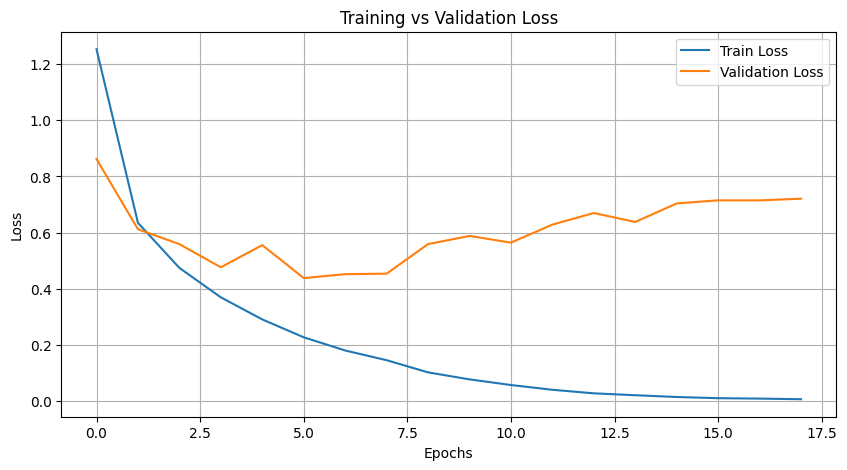

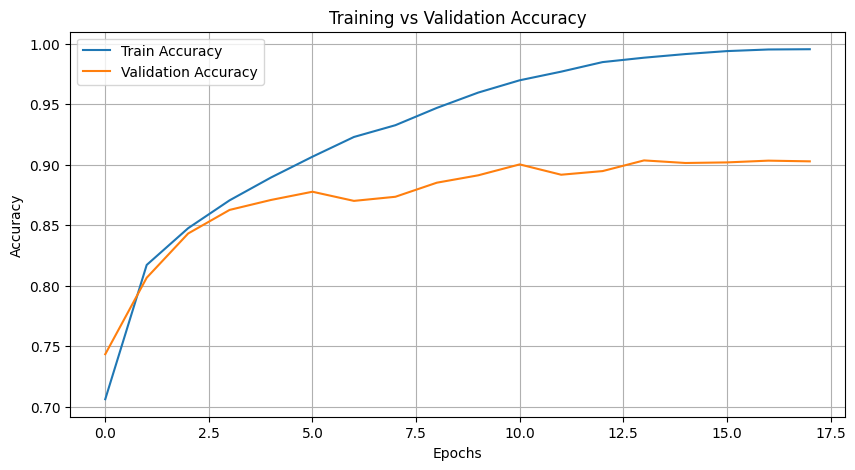

In [ ]:
import matplotlib.pyplot as plt

# Plot Training vs Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(model.train_losses, label="Train Loss")
plt.plot(model.val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid()
plt.show()

# Plot Training vs Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(model.train_accuracies, label="Train Accuracy")
plt.plot(model.val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.grid()
plt.show()

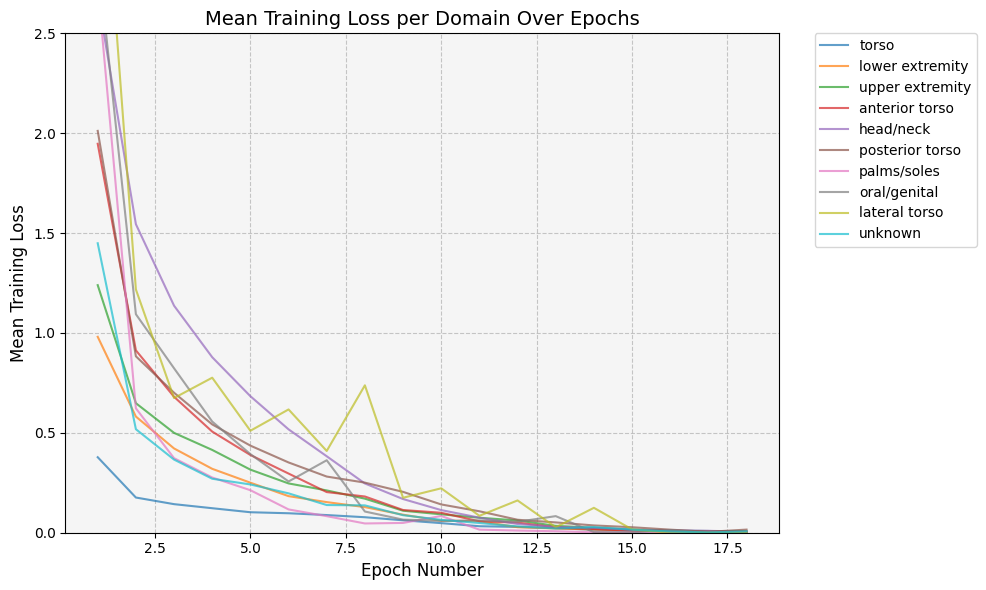

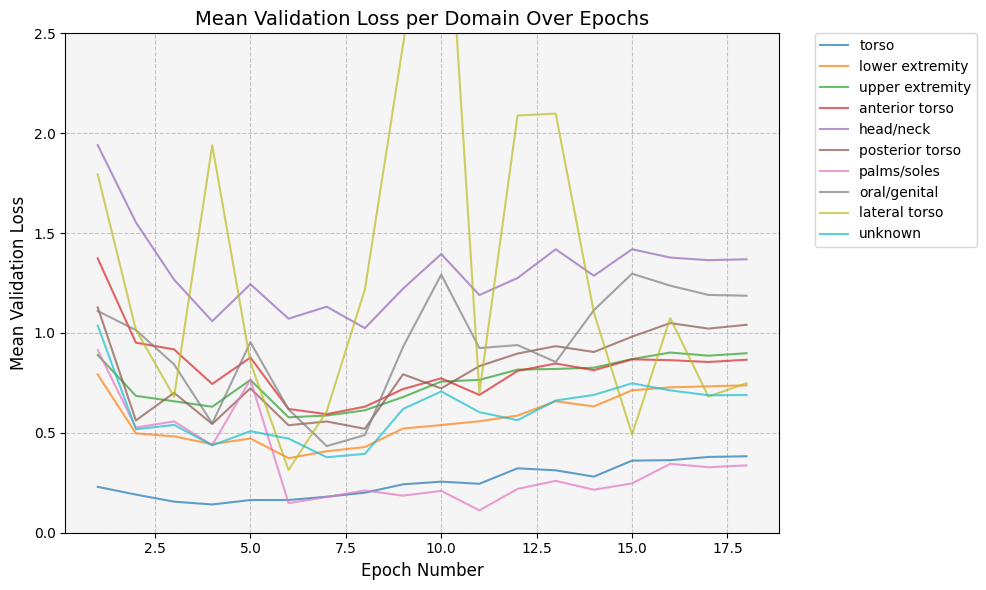

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Map domain IDs to names
domain_id_to_name = {
    0: 'torso',
    1: 'lower extremity',
    2: 'upper extremity',
    3: 'anterior torso',
    4: 'head/neck',
    5: 'posterior torso',
    6: 'palms/soles',
    7: 'oral/genital',
    8: 'lateral torso',
    9: 'unknown'
}

# Plot Mean Training Loss per Domain Over Epochs
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_train_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Training Loss', fontsize=12)
plt.title('Mean Training Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()

# Plot Mean Validation Loss per Domain Over Epochs (already present)
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_val_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Validation Loss', fontsize=12)
plt.title('Mean Validation Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()
# After each plt.show(), add:
plt.savefig('mean_training_loss_per_domain.png', bbox_inches='tight', dpi=300)
plt.savefig('mean_validation_loss_per_domain.png', bbox_inches='tight', dpi=300)

Loading best checkpoint for testing: skin_lesion_model_dat_vitbaseline/best_model.ckpt
Successfully loaded pre-trained weights for ViT: 86389248 parameters
Testing the model using BaseEvaluator...
Successfully loaded pre-trained weights for ViT: 86389248 parameters


<ipython-input-18-4bc7f2a0ecca>:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(self.checkpoint_path, map_location=self.device)


Checkpoint loaded successfully!
Batch 1: Collected 16 predictions
Batch 2: Collected 16 predictions
Batch 3: Collected 16 predictions
Batch 4: Collected 16 predictions
Batch 5: Collected 16 predictions
Batch 6: Collected 16 predictions
Batch 7: Collected 16 predictions
Batch 8: Collected 16 predictions
Batch 9: Collected 16 predictions
Batch 10: Collected 16 predictions
Batch 11: Collected 16 predictions
Batch 12: Collected 16 predictions
Batch 13: Collected 16 predictions
Batch 14: Collected 16 predictions
Batch 15: Collected 16 predictions
Batch 16: Collected 16 predictions
Batch 17: Collected 16 predictions
Batch 18: Collected 16 predictions
Batch 19: Collected 16 predictions
Batch 20: Collected 16 predictions
Batch 21: Collected 16 predictions
Batch 22: Collected 16 predictions
Batch 23: Collected 16 predictions
Batch 24: Collected 16 predictions
Batch 25: Collected 16 predictions
Batch 26: Collected 16 predictions
Batch 27: Collected 16 predictions
Batch 28: Collected 16 predictio

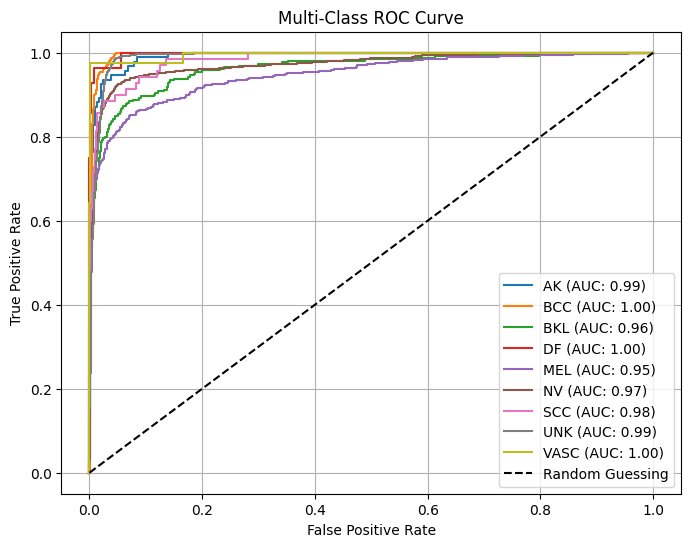

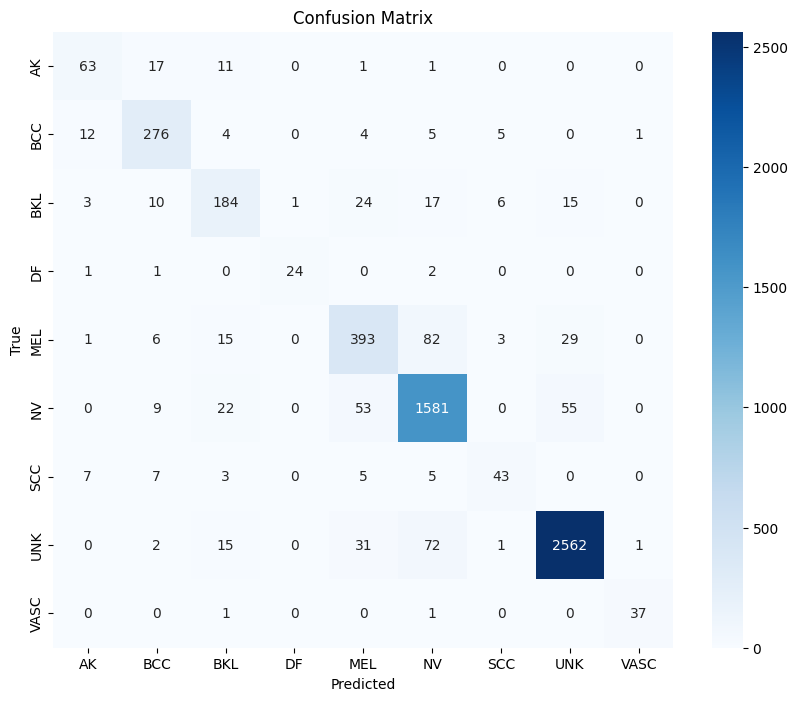


Plotting first 10 images with predictions:


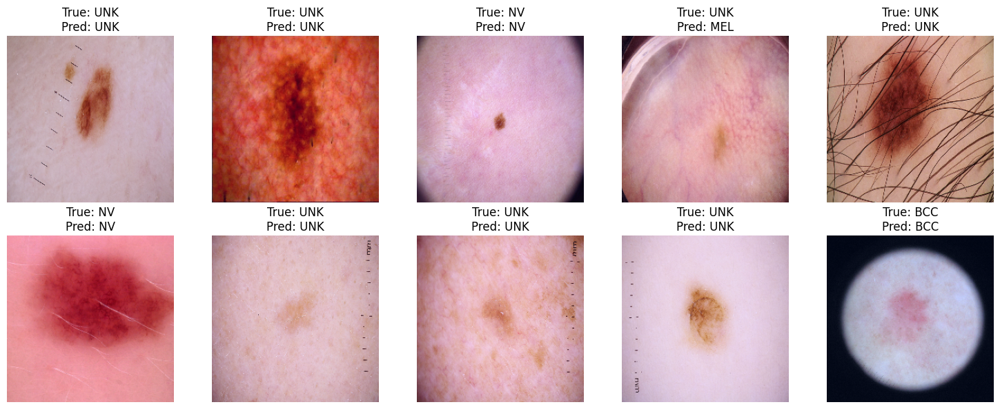

In [ ]:
best_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
if os.path.exists(best_checkpoint_path):
    print(f"Loading best checkpoint for testing: {best_checkpoint_path}")
    model = DomainAdaptiveViT.load_from_checkpoint(best_checkpoint_path)
    model.evaluator.checkpoint_path = best_checkpoint_path  # Set for evaluator if needed
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # Test the model (assuming test_dataloader is defined)
    print("Testing the model using BaseEvaluator...")
    # trainer.test(model, test_dataloader)  # Alternatively, use trainer.test
    model.evaluator.evaluate(test_dataloader)  # Direct call to evaluator
else:
    print(f"Best checkpoint not found at {best_checkpoint_path}. Cannot proceed with testing.")

In [ ]:
# Save the model's state dictionary
torch.save(model.state_dict(), "trained_model_dat_vit_Baseline.pth")

In [ ]:
# Extract layer names
layer_names = [name for name, param in model.named_parameters()]
layer_names.reverse()  # Reverse to start from the last layers

# Print first few layers to verify
print("layer names (from the last layers):")
print(layer_names)

layer names (from the last layers):
['fc.bias', 'fc.weight', 'vit.pooler.dense.bias', 'vit.pooler.dense.weight', 'vit.layernorm.bias', 'vit.layernorm.weight', 'vit.encoder.layer.11.layernorm_after.bias', 'vit.encoder.layer.11.layernorm_after.weight', 'vit.encoder.layer.11.layernorm_before.bias', 'vit.encoder.layer.11.layernorm_before.weight', 'vit.encoder.layer.11.output.dense.bias', 'vit.encoder.layer.11.output.dense.weight', 'vit.encoder.layer.11.intermediate.dense.bias', 'vit.encoder.layer.11.intermediate.dense.weight', 'vit.encoder.layer.11.attention.output.dense.bias', 'vit.encoder.layer.11.attention.output.dense.weight', 'vit.encoder.layer.11.attention.attention.value.bias', 'vit.encoder.layer.11.attention.attention.value.weight', 'vit.encoder.layer.11.attention.attention.key.bias', 'vit.encoder.layer.11.attention.attention.key.weight', 'vit.encoder.layer.11.attention.attention.query.bias', 'vit.encoder.layer.11.attention.attention.query.weight', 'vit.encoder.layer.10.layernorm_a

In [ ]:
!pip install grad-cam
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 77.1 MB/s eta 0:00:00:00:010:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39680 sha256=5615ee8248a29457be983fd9bb5ddb33df82c818073ef35e9023a3d419c3224d
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 29.0 MB/s eta 0:00:0000:01


In [ ]:
from transformers import ViTModel
import os

# Verify pre-trained weights load
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,  # Ensure defined
    class_weights_tensor=class_weights_tensor
)
vit = ViTModel.from_pretrained("google/vit-base-patch16-224")
print(f"ViT weights loaded: {sum(p.numel() for p in vit.parameters())} parameters")
model.vit = vit  # Explicitly assign

Successfully loaded pre-trained weights for ViT: 86389248 parameters


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViT weights loaded: 86389248 parameters


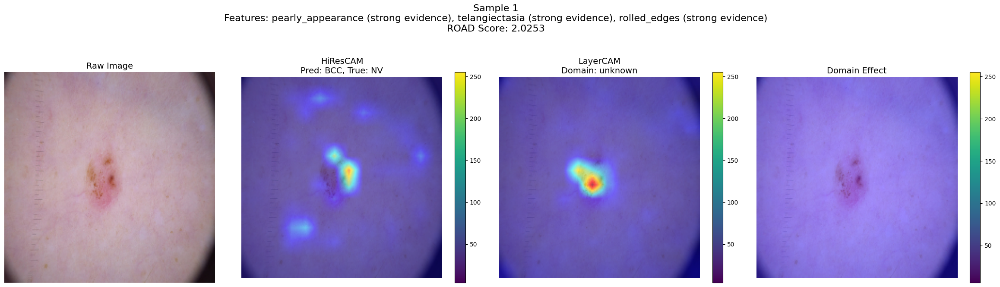

Sample 1: Predicted=BCC, True=NV, ROAD Score=2.0253, Domain=unknown


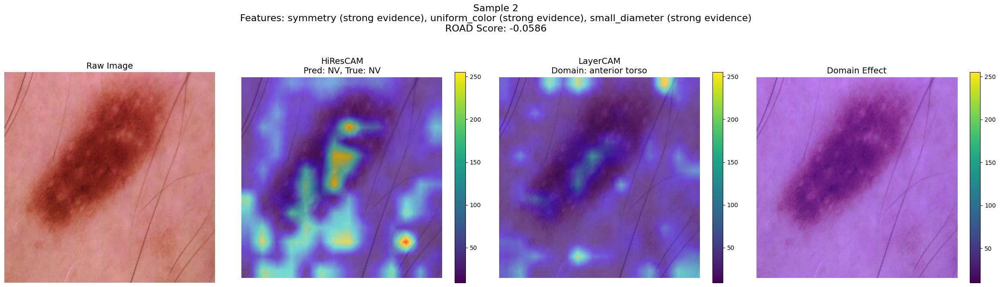

Sample 2: Predicted=NV, True=NV, ROAD Score=-0.0586, Domain=anterior torso


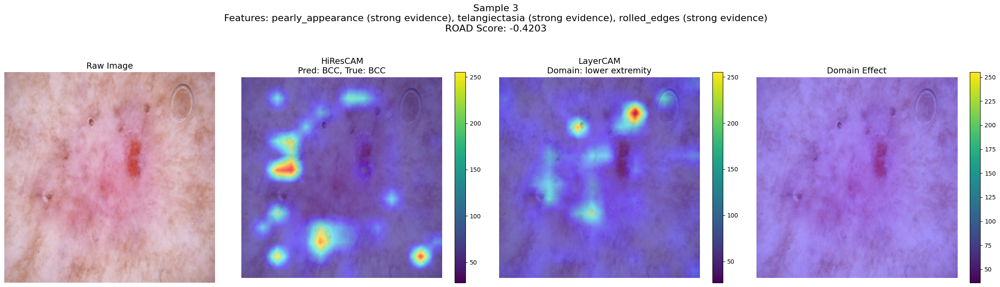

Sample 3: Predicted=BCC, True=BCC, ROAD Score=-0.4203, Domain=lower extremity


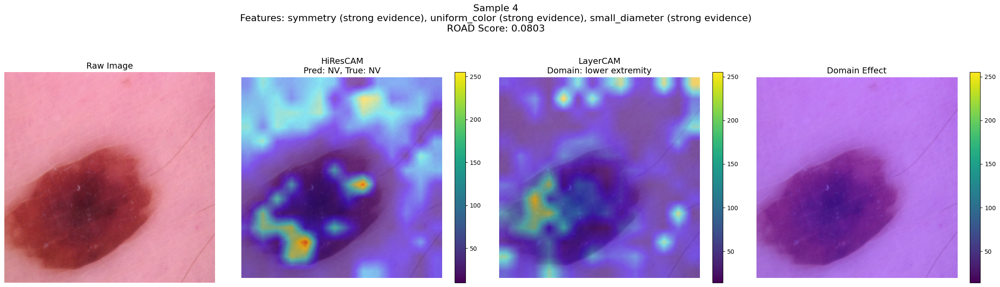

Sample 4: Predicted=NV, True=NV, ROAD Score=0.0803, Domain=lower extremity


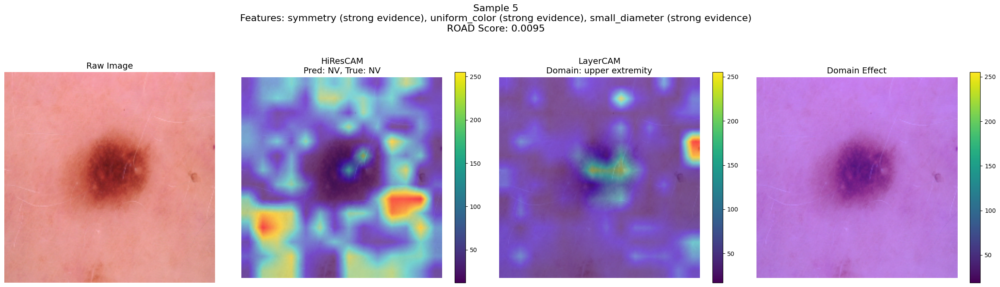

Sample 5: Predicted=NV, True=NV, ROAD Score=0.0095, Domain=upper extremity


In [ ]:
# XAI Functions
def vit_reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

def denormalize(img_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * std + mean
    return np.clip(img, 0, 1)

class ModelWithDomain(nn.Module):
    def __init__(self, model, domain_id):
        super().__init__()
        self.model = model
        self.domain_id = domain_id

    def forward(self, x):
        if x.dim() == 3:
            x = x.unsqueeze(0)
        if self.domain_id is None:
            default_domain = torch.tensor([9], device=x.device)
            return self.model(x, default_domain)
        return self.model(x, self.domain_id)

def apply_xai(model, dataloader, num_samples=5):
    model.eval()
    device = next(model.parameters()).device
    targets = [ClassifierOutputTarget(i) for i in range(9)]
    road_metric = ROADMostRelevantFirst(percentile=75)
    target_layers_hires = [model.vit.encoder.layer[-1].layernorm_before]
    target_layers_layer = [model.vit.encoder.layer[0].layernorm_before]

    sample_count = 0
    for batch in dataloader:
        images, labels, domains = batch
        images = images.to(device)
        labels = labels.to(device)
        domains = domains.to(device)

        for i in range(len(images)):
            if sample_count >= num_samples:
                break

            image = images[i]
            label = labels[i].item()
            domain = domains[i].item()
            input_tensor = image.unsqueeze(0).to(device)
            domain_id = torch.tensor([domain], device=device)
            rgb_img = denormalize(image)

            model_with_domain = ModelWithDomain(model, domain_id)
            model_no_domain = ModelWithDomain(model, None)

            with HiResCAM(model=model_with_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                hires_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                pred_idx = torch.argmax(model_with_domain(input_tensor), dim=1).item()
                hires_vis = show_cam_on_image(rgb_img, hires_cam[0], use_rgb=True)

            with LayerCAM(model=model_with_domain, target_layers=target_layers_layer, reshape_transform=vit_reshape_transform) as cam:
                layer_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                layer_vis = show_cam_on_image(rgb_img, layer_cam[0], use_rgb=True)

            with HiResCAM(model=model_no_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                no_domain_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                diff_cam = hires_cam[0] - no_domain_cam[0]
                diff_vis = show_cam_on_image(rgb_img, diff_cam, use_rgb=True)

            road_scores = road_metric(input_tensor, hires_cam, targets, model_with_domain)
            road_score_mean = road_scores.mean() if road_scores.size else 0.0

            pred_class = class_names[pred_idx]
            true_class = class_names[label]
            features_detected = []
            cam_max = hires_cam[0].max().item()
            threshold = min(0.3, cam_max * 0.5)
            for feature in ontology[pred_class]:
                if cam_max > threshold:
                    confidence = "strong" if cam_max > 0.7 else "moderate"
                    features_detected.append(f"{feature} ({confidence} evidence)")

            domain_name = list(domain_map.keys())[list(domain_map.values()).index(domain)]

            plt.figure(figsize=(24, 6))
            plt.subplot(1, 4, 1)
            plt.imshow(rgb_img)
            plt.title("Raw Image", fontsize=14)
            plt.axis('off')
            plt.subplot(1, 4, 2)
            plt.imshow(hires_vis)
            plt.title(f"HiResCAM\nPred: {pred_class}, True: {true_class}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 3)
            plt.imshow(layer_vis)
            plt.title(f"LayerCAM\nDomain: {domain_name}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 4)
            plt.imshow(diff_vis)
            plt.title("Domain Effect", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.suptitle(
                f"Sample {sample_count+1}\n"
                f"Features: {', '.join(features_detected) if features_detected else 'None'}\n"
                f"ROAD Score: {road_score_mean:.4f}",
                fontsize=16, y=1.1
            )
            plt.tight_layout()
            plt.show()

            print(f"Sample {sample_count+1}: Predicted={pred_class}, True={true_class}, ROAD Score={road_score_mean:.4f}, Domain={domain_name}")
            sample_count += 1
        if sample_count >= num_samples:
            break

apply_xai(evaluator.model, test_dataloader, num_samples=5)